In [17]:
import pandas as pd
import numpy as np

import seaborn as sns

from matplotlib import pyplot as plt


In [18]:
cremad_info = '../datasets/cremad_df.csv'
emofilm_info = '../datasets/emofilm_df.csv'
emofilm_uk_info = '../datasets/emofilm_uk_df.csv'
uk_new_info = '../datasets/emofilm_uk_new_test_df.csv'
savee_info = '../datasets/savee_df.csv'
tess_info = '../datasets/tess_df.csv'

In [19]:
cremad = pd.read_csv(cremad_info)
emofilm = pd.read_csv(emofilm_info)
emofilm_uk = pd.read_csv(emofilm_uk_info)
uk_new = pd.read_csv(uk_new_info)
savee = pd.read_csv(savee_info)
tess = pd.read_csv(tess_info)

uk_new['emotion'].replace('calm', 'neutral', inplace=True)

complete = pd.concat([cremad, emofilm, emofilm_uk, savee, tess, uk_new], ignore_index=True)
complete.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11903 entries, 0 to 11902
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   emotion  11902 non-null  object
 1   path     11903 non-null  object
dtypes: object(2)
memory usage: 186.1+ KB


In [20]:
emofilm_details = pd.read_csv('../datasets/emofilm/complete_info_t.csv')
emofilm_details.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1115 entries, 0 to 1114
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   file           1115 non-null   object
 1   speaker        1115 non-null   object
 2   film           1115 non-null   object
 3   emotion        1115 non-null   object
 4   language       1115 non-null   object
 5   transcritpion  1115 non-null   object
 6   timestamp      347 non-null    object
dtypes: object(7)
memory usage: 61.1+ KB


In [21]:
# Define a pattern to match the desired file name template
female_patterns = ['f_ans001a', 'f_dis008a', 'f_gio012a', 'f_rab009a', 'f_tri002a']
male_patterns = ["m_ans002a", "m_dis001a", "m_gio001a", "m_rab006a", "m_tri002a"]


def filter_by_pattern(df, col, patterns):
    filtered = pd.DataFrame()
    for p in patterns:
        filtered = pd.concat([filtered, df[df[col].str.contains(p)]])
    return filtered


emofilm_f_filtered = filter_by_pattern(emofilm, 'path', female_patterns)
emofilm_m_filtered = filter_by_pattern(emofilm, 'path', male_patterns)
print(len(emofilm_f_filtered))
print(len(emofilm_m_filtered))

15
15


In [22]:
emofilm_m_filtered

,emotion,path
539,fear,D:/Programming/nn/emotion_classification/datas...
540,fear,D:/Programming/nn/emotion_classification/datas...
541,fear,D:/Programming/nn/emotion_classification/datas...
647,contempt,D:/Programming/nn/emotion_classification/datas...
648,contempt,D:/Programming/nn/emotion_classification/datas...
649,contempt,D:/Programming/nn/emotion_classification/datas...
729,happiness,D:/Programming/nn/emotion_classification/datas...
730,happiness,D:/Programming/nn/emotion_classification/datas...
731,happiness,D:/Programming/nn/emotion_classification/datas...
872,anger,D:/Programming/nn/emotion_classification/datas...


In [23]:
emofilm_examples = emofilm_details.groupby(['language', 'emotion']).head(3)
print(emofilm_examples.emotion.value_counts())

ans    9
dis    9
gio    9
rab    9
tri    9
Name: emotion, dtype: int64


In [24]:
complete_examples = complete.groupby('emotion').head(3)
print(complete_examples.emotion.value_counts())

anger        3
contempt     3
fear         3
happiness    3
neutral      3
sadness      3
surprise     3
Name: emotion, dtype: int64


In [25]:
emofilm_uk_examples = uk_new.groupby(['emotion']).head(3)
print(emofilm_uk_examples.emotion.value_counts())

fear         3
neutral      3
contempt     3
happiness    3
anger        3
surprise     3
sadness      3
Name: emotion, dtype: int64


In [26]:
def_color = "#1f77b4"

## histogram

In [27]:
complete

,emotion,path
0,anger,D:/Programming/nn/emotion_classification/datas...
1,contempt,D:/Programming/nn/emotion_classification/datas...
2,fear,D:/Programming/nn/emotion_classification/datas...
3,happiness,D:/Programming/nn/emotion_classification/datas...
4,neutral,D:/Programming/nn/emotion_classification/datas...
...,...,...
11898,sadness,I:\obs\wav_uk_test_ext1\tri_t_1.wav
11899,sadness,I:\obs\wav_uk_test_ext1\tri_t_2.wav
11900,sadness,I:\obs\wav_uk_test_ext1\tri_t_3.wav
11901,sadness,I:\obs\wav_uk_test_ext1\tri_t_4.wav


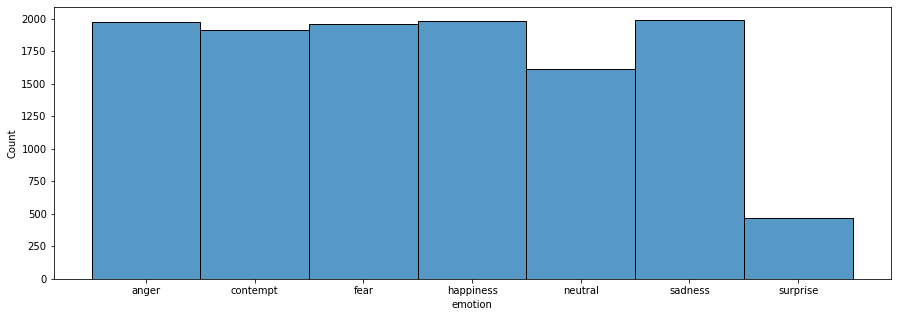

In [28]:
fig = plt.figure(figsize=(15, 5))
sns.histplot(data=complete, x='emotion', color=def_color)
plt.show()

## Imports

In [29]:
from os import listdir
from os.path import isfile, join, basename
from scipy.io import wavfile
from scipy import signal

import librosa
import librosa.display

## Waveform

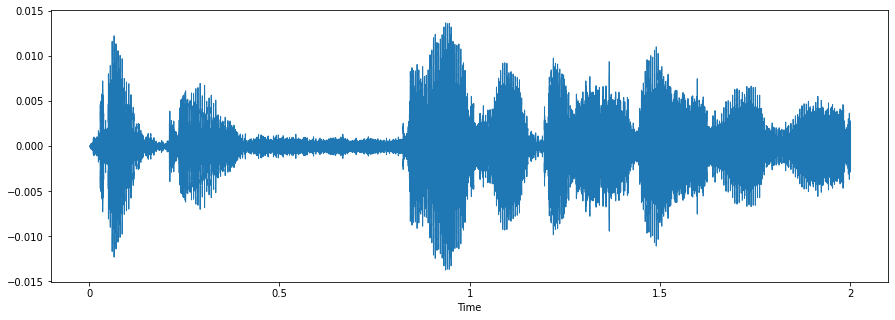

In [30]:
y, sr = librosa.load(emofilm_uk_examples.iloc[4].path, duration=2)
plt.figure(figsize=(15, 5))
librosa.display.waveshow(y, sr=sr, color=def_color)
plt.show()

## spectrograms

In [31]:
# def print_spectogram(file_path, trim_=False):
#     a, s = librosa.load(file_path)
#     fr, tm, spgram = signal.spectrogram(a, s)
#     lspg = np.log(spgram)
#     plt.pcolormesh(tm, fr, lspg, shading='auto')
#     plt.ylabel('Frequency (Hz)')
#     plt.xlabel('Time (sec)')
#     plt.show()

In [32]:
def print_spectograms(df, trim_silence=False):
    emotions = df.emotion.unique()
    for e in emotions:
        rows = df.loc[df.emotion == e]
        fig, axs = plt.subplots(1, len(rows), figsize=(22, 5))
        ai = 0
        for i, row in rows.iterrows():
            a, s = librosa.load(row.path)

            if (trim_silence):
                a, index = librosa.effects.trim(a)

            fr, tm, spgram = signal.spectrogram(a, s)
            lspg = np.log(spgram)
            axs[ai].set_title(basename(row.path))
            axs[ai].pcolormesh(tm, fr, lspg, shading='auto')
            # axs[ai].ylabel('Frequency (Hz)')  
            # axs[ai].xlabel('Time (sec)')
            ai += 1


        for ax in axs.flat:
            ax.set(ylabel='Peak Freq (Hz)')
        fig.suptitle(f'{e}')
        plt.xlabel('Time (sec)')
        # plt.ylabel('Peak Freq (Hz)')
        plt.show()

## complete

C:\Users\nicko\AppData\Local\Temp\ipykernel_12020\3156930616.py:14: RuntimeWarning: divide by zero encountered in log
  lspg = np.log(spgram)


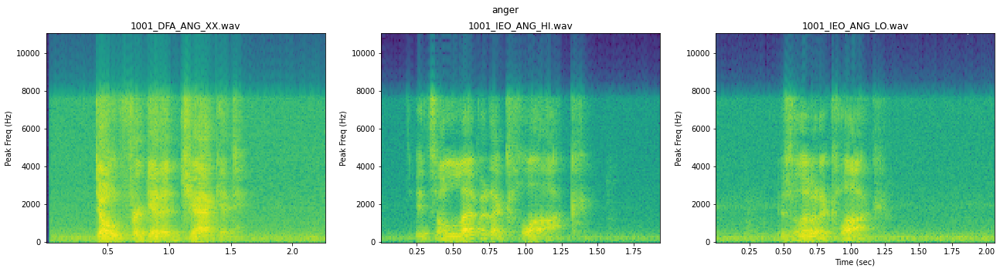

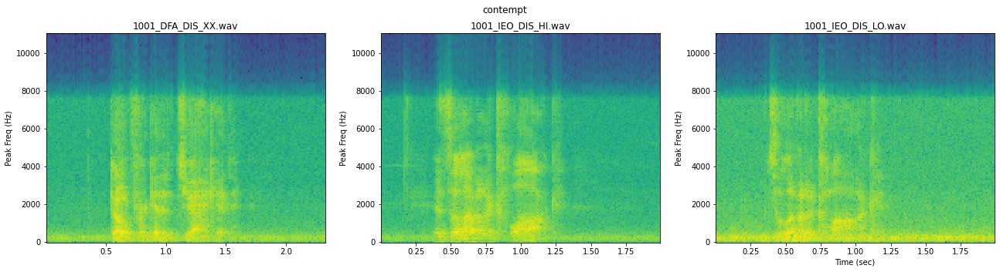

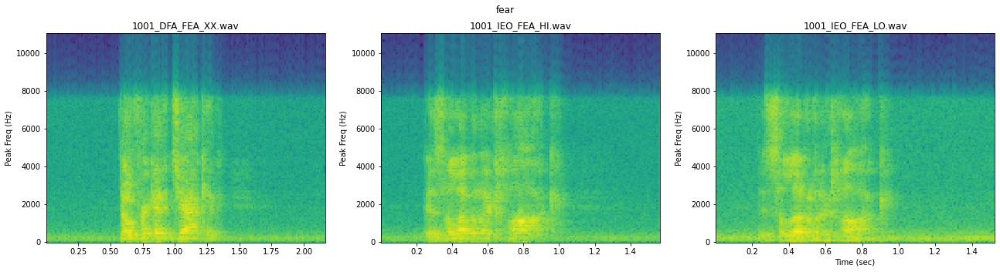

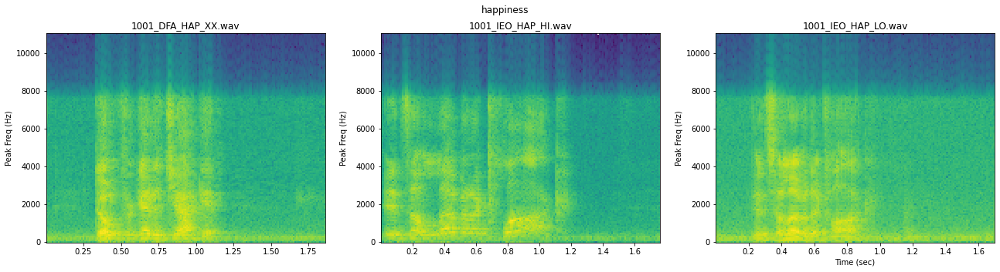

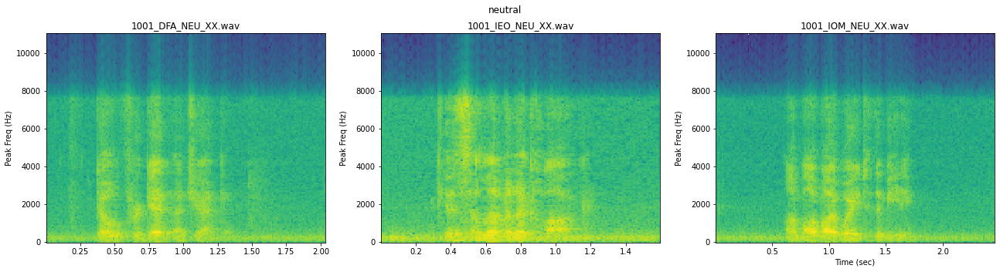

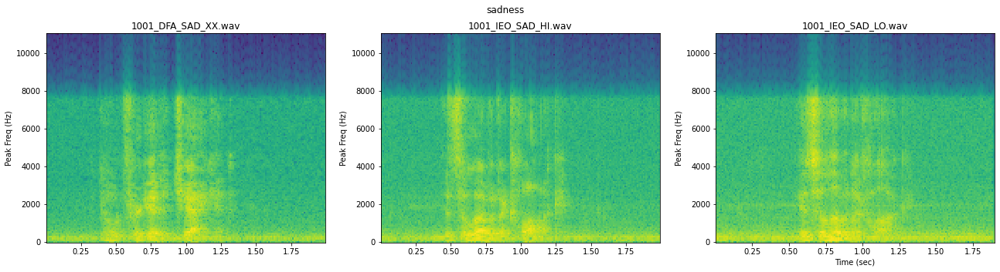

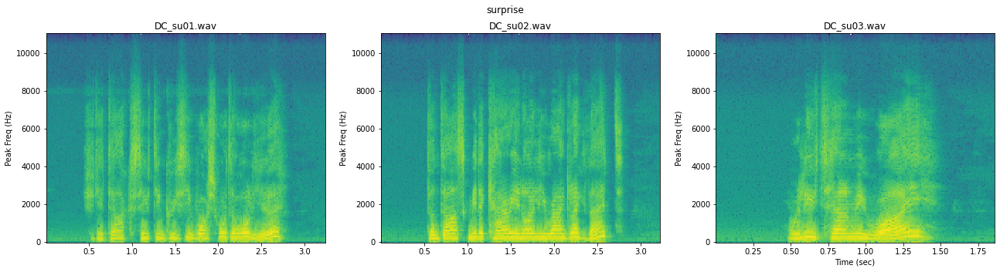

In [33]:
print_spectograms(complete_examples)

## What about diffences between languages?

Behold! Examples of the same phrase in english, spanish, italian and ukrainian.

### Male voices

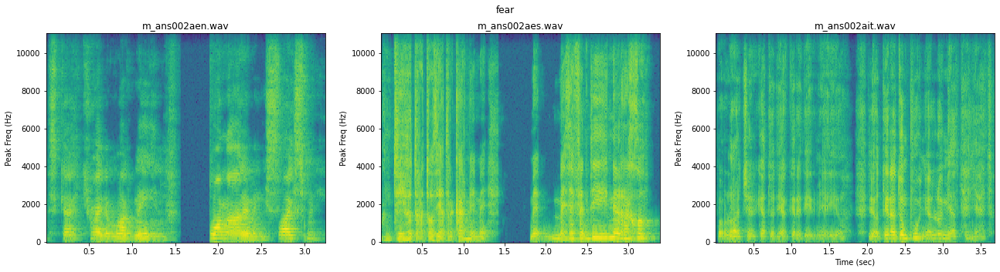

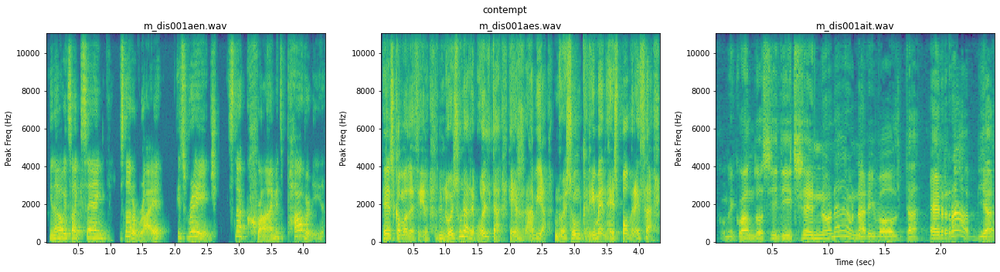

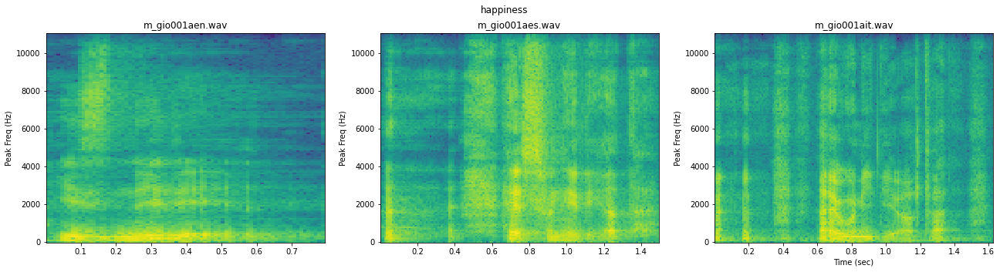

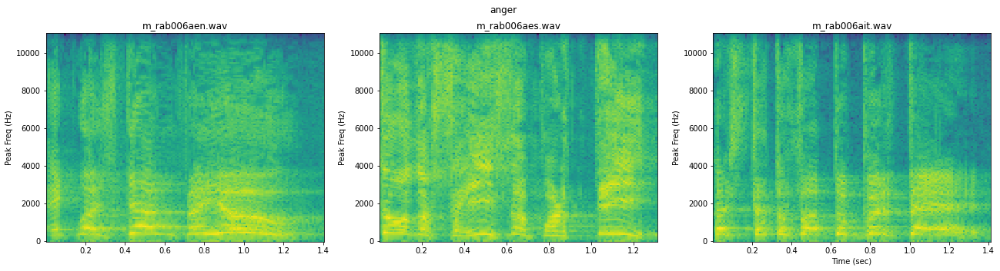

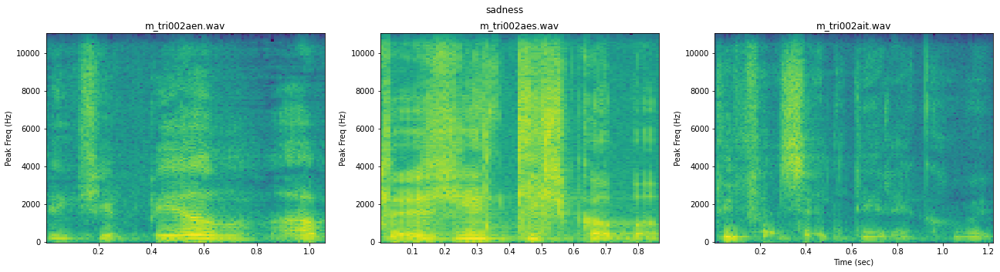

In [34]:
print_spectograms(emofilm_m_filtered)

### Female voices:

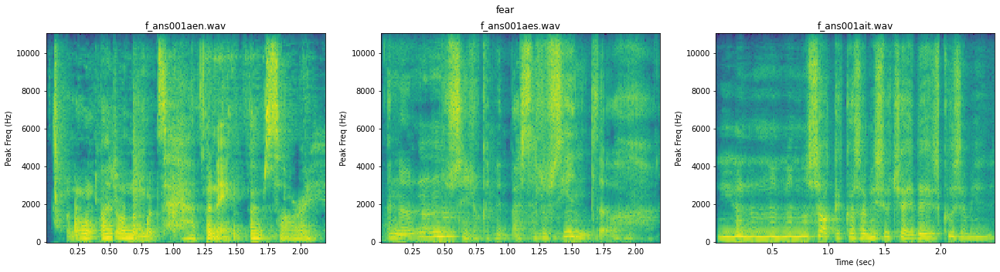

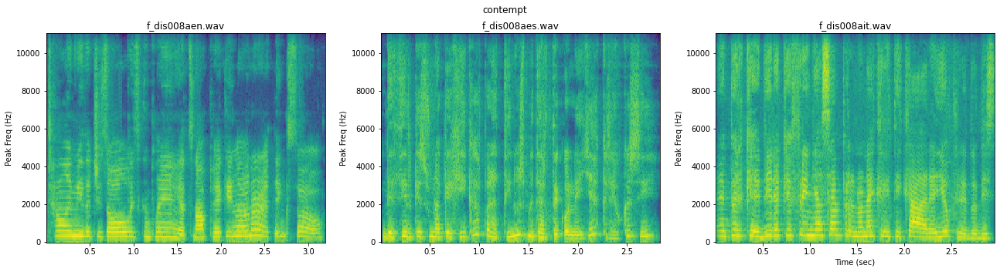

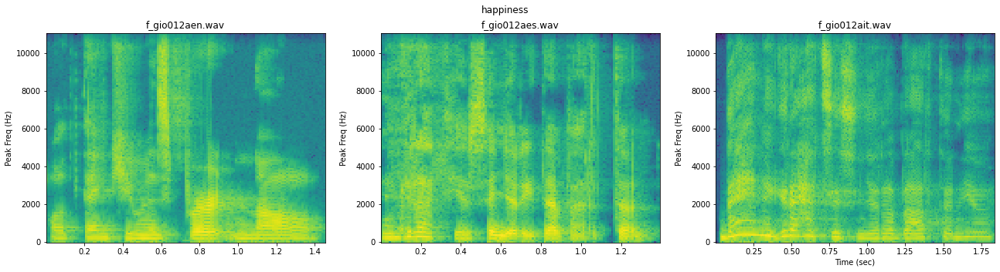

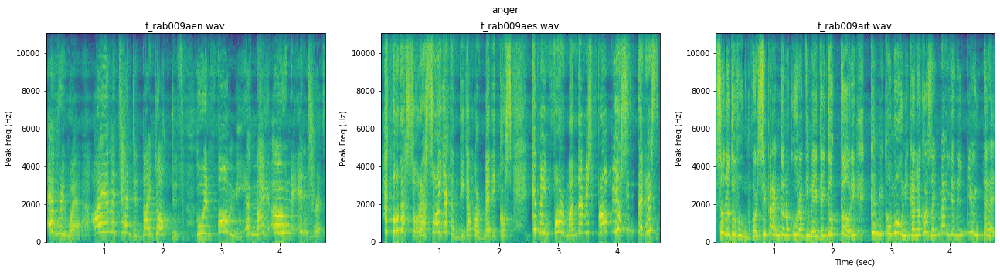

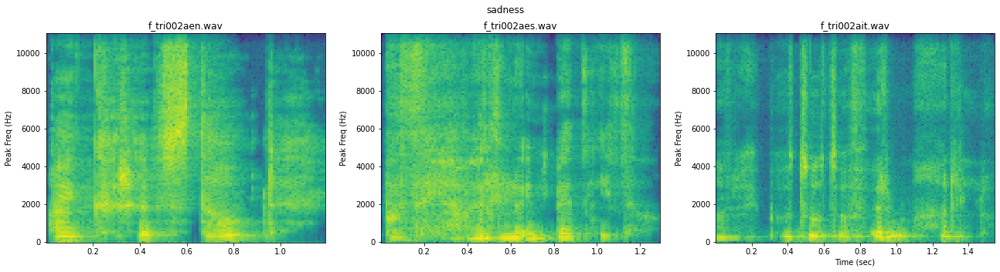

In [35]:
print_spectograms(emofilm_f_filtered)

### Ukrainian

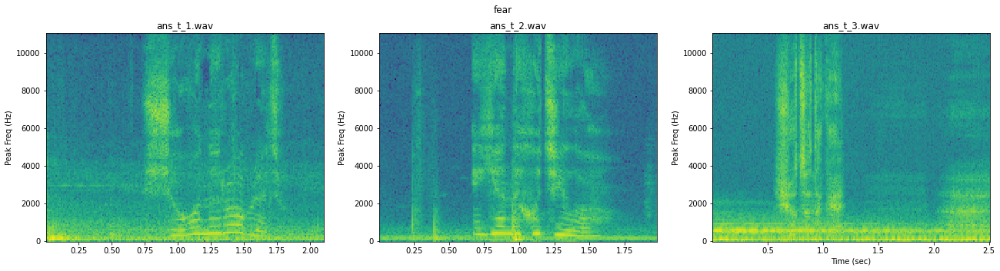

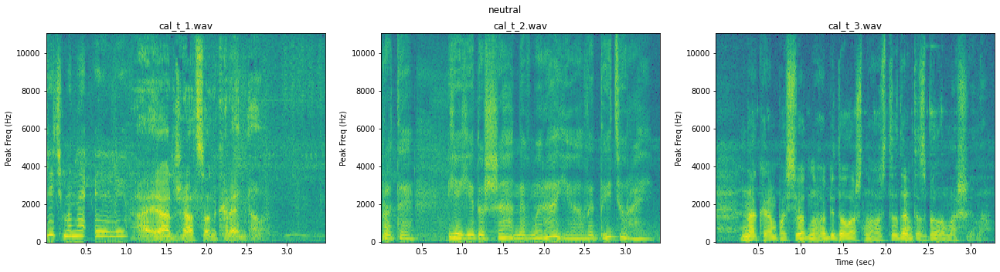

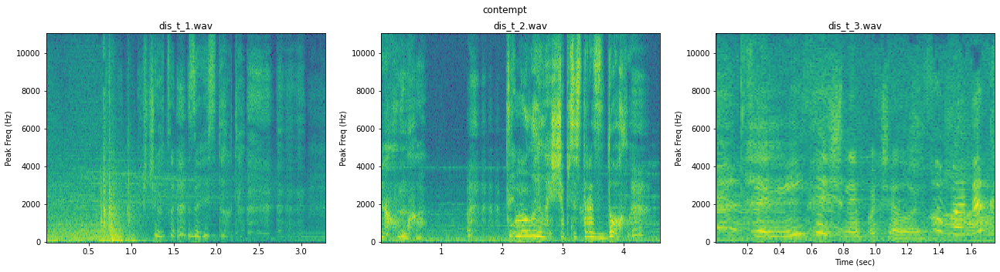

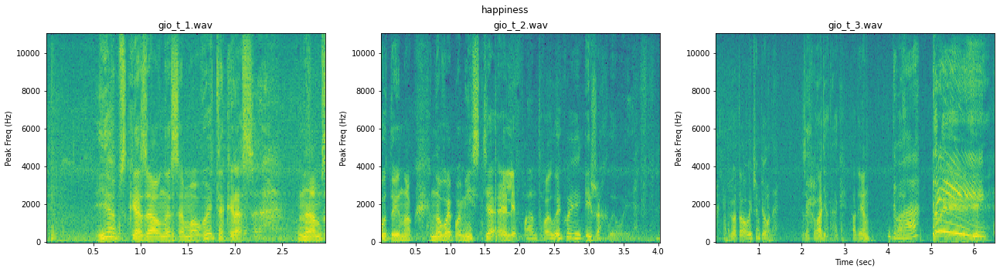

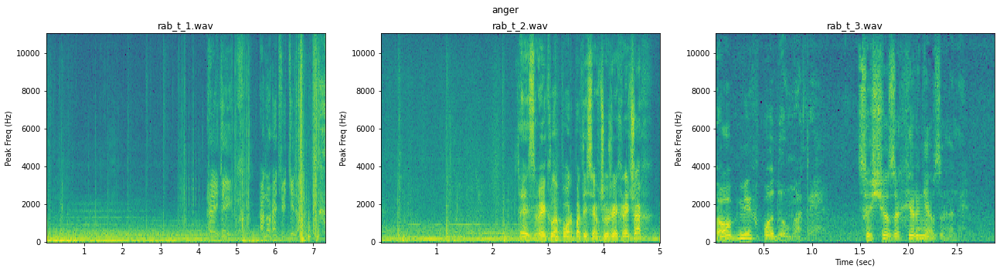

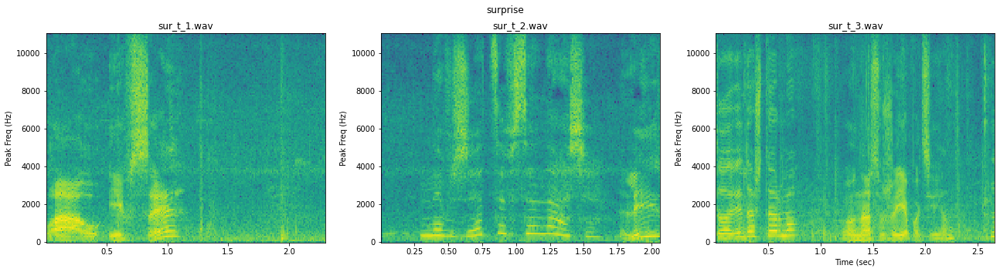

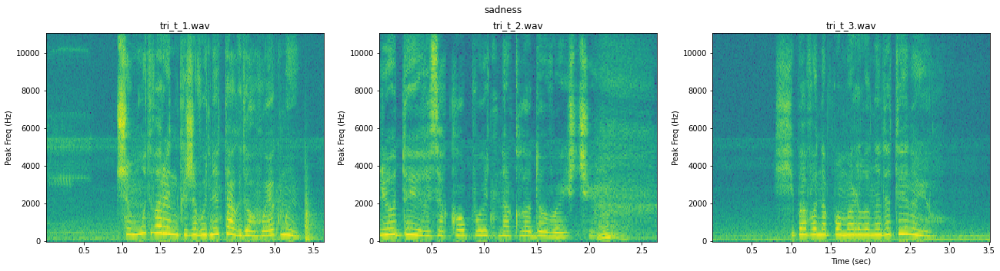

In [36]:
print_spectograms(emofilm_uk_examples, trim_silence=True)

## Mels

In [37]:
def print_mel(df, trim_silence=False):
    emotions = df.emotion.unique()
    for e in emotions:
        rows = df.loc[df.emotion == e]
        fig, axs = plt.subplots(1, len(rows), figsize=(22, 5))
        ai = 0
        for i, row in rows.iterrows():
            a, s = librosa.load(row.path)
            if (trim_silence):
                a, index = librosa.effects.trim(a)
            mel = librosa.feature.melspectrogram(
            y=a, sr=s, n_fft=1024, hop_length=345, n_mels=64)
            mel_spect = librosa.power_to_db(mel, ref=np.max)

            axs[ai].set_title(basename(row.path))
            # axs[ai].pcolormesh(tm, fr, lspg, shading='auto')
            img = librosa.display.specshow(mel_spect, sr=s, x_axis='time', y_axis='mel', ax=axs[ai])
            fig.colorbar(img, ax=axs[ai], format='%+2.0f dB')
            ai += 1


        # for ax in axs.flat:
        #     ax.set(ylabel='Mel')
        fig.suptitle(f'{e}')

        plt.xlabel('Time (sec)')
        plt.show()


### complete

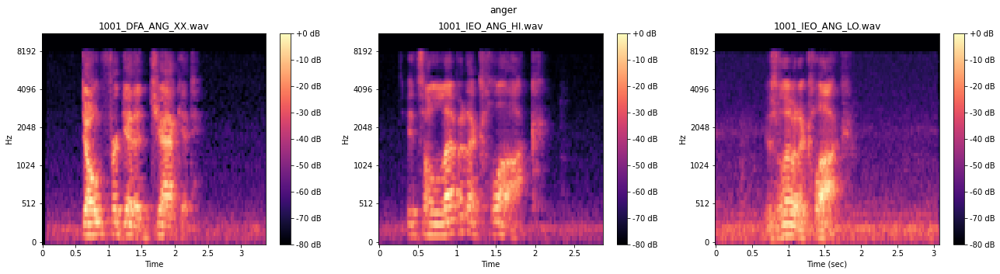

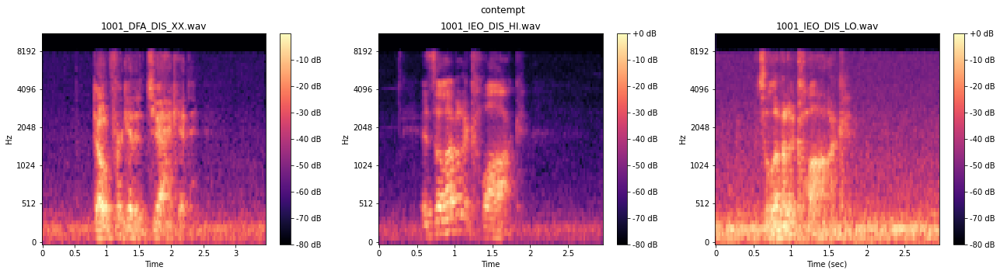

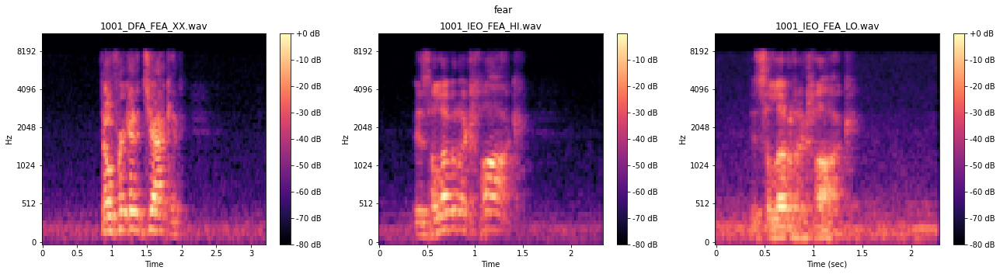

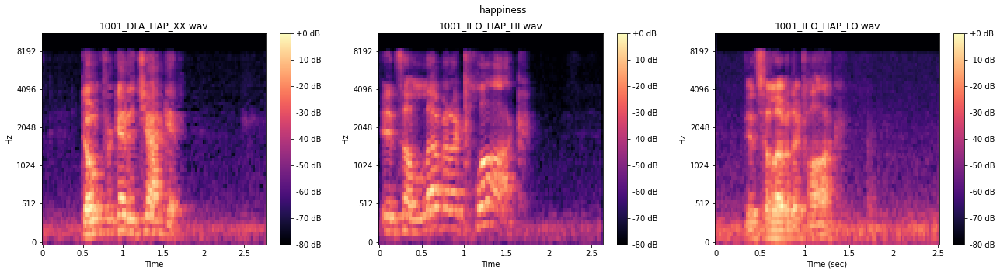

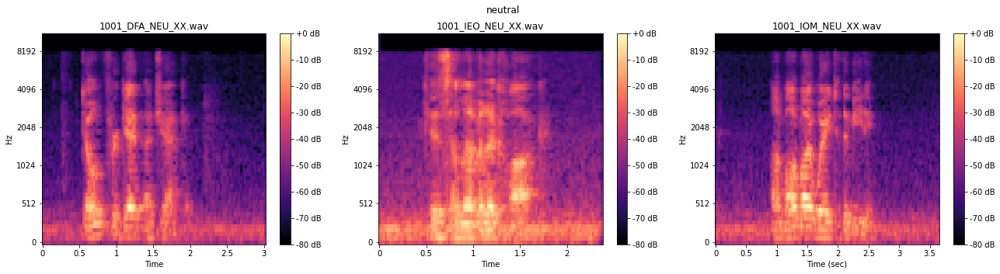

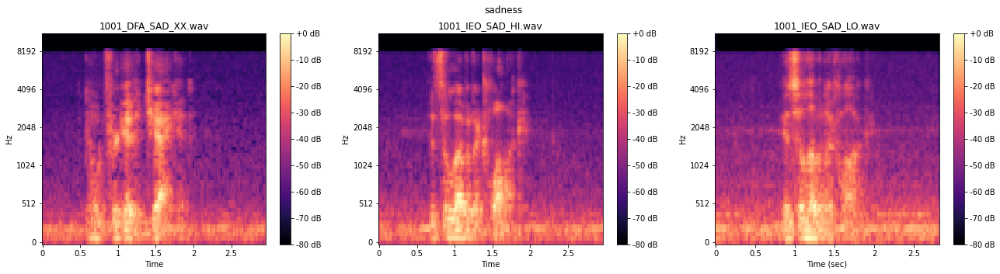

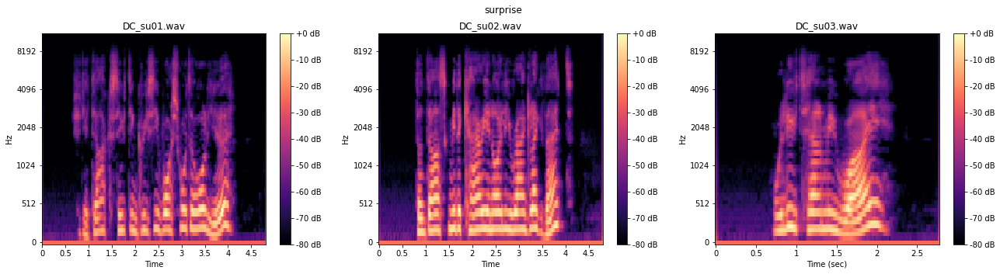

In [38]:
print_mel(complete_examples)

### male

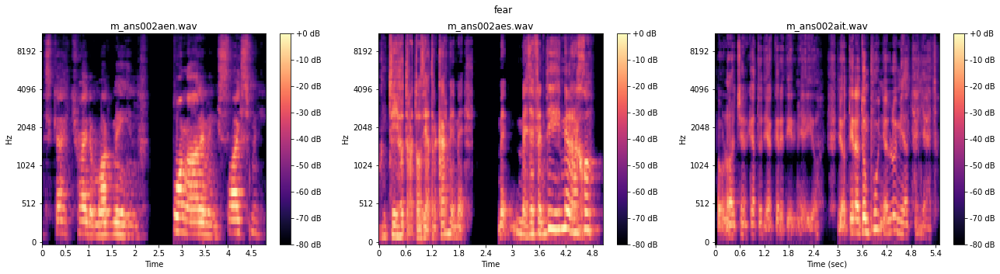

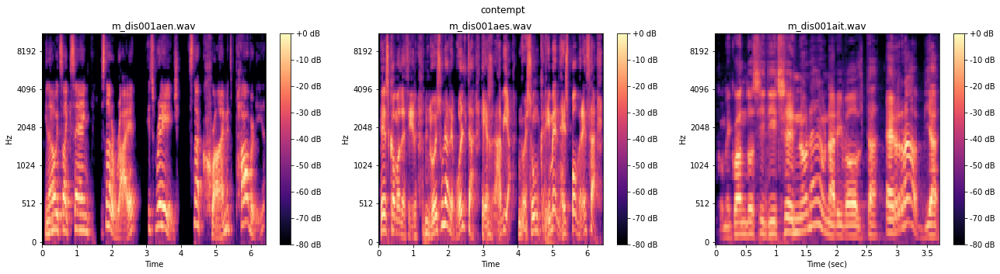

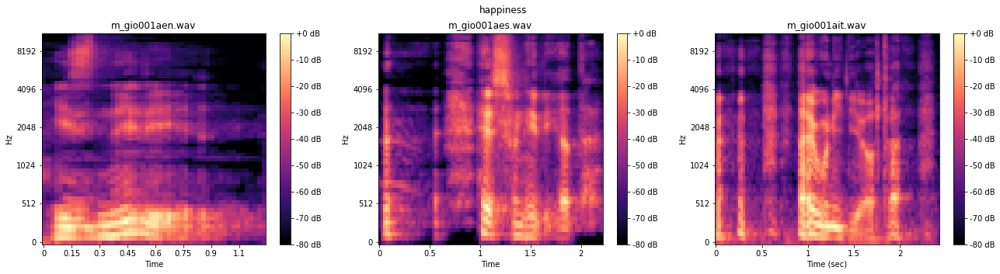

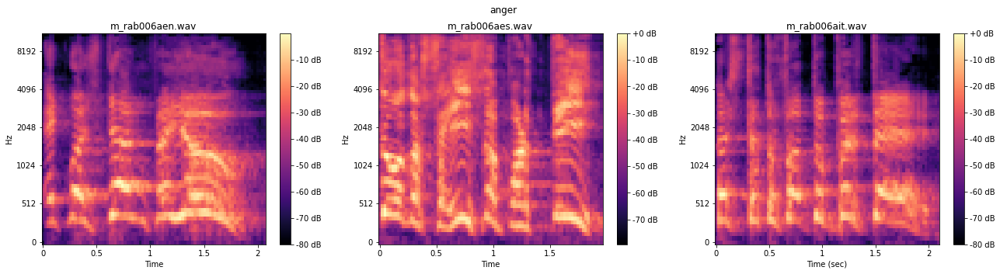

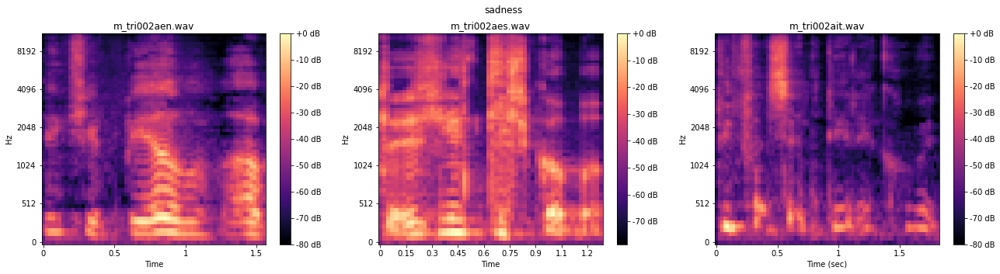

In [39]:
print_mel(emofilm_m_filtered)

### female

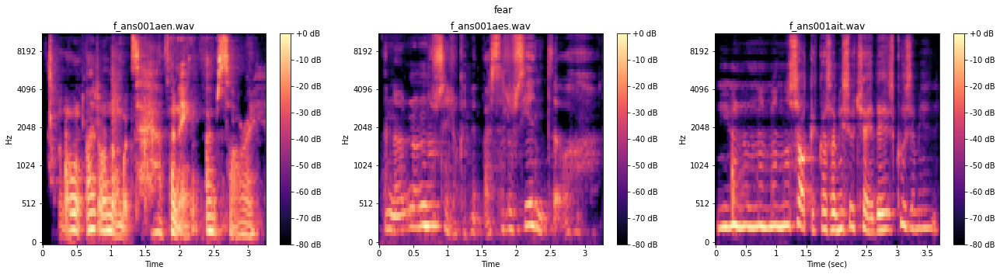

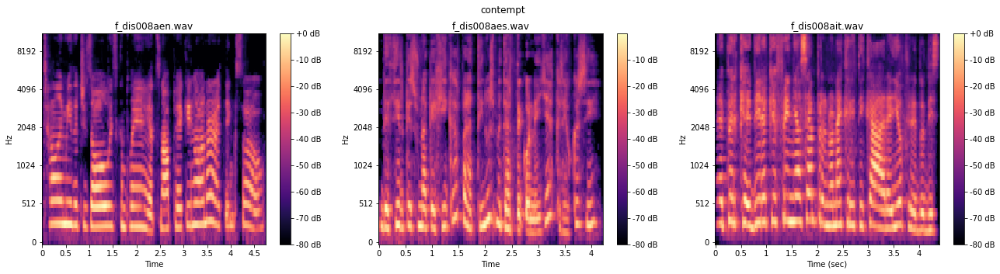

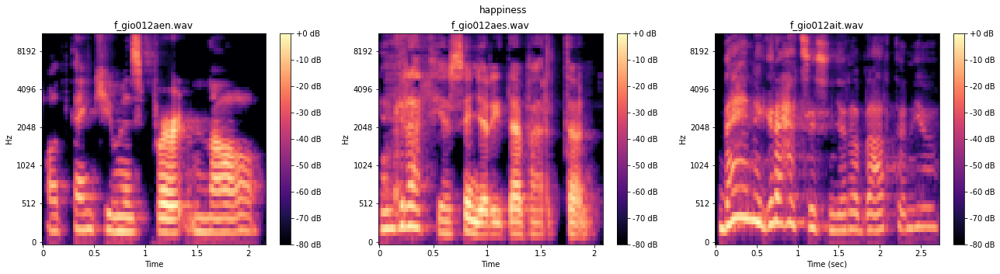

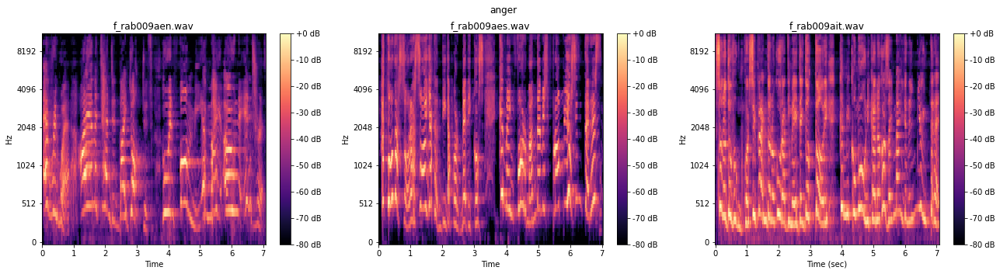

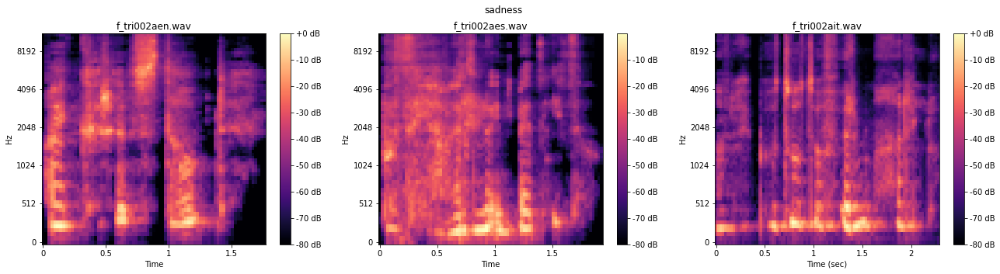

In [40]:
print_mel(emofilm_f_filtered)

### Ukrainian

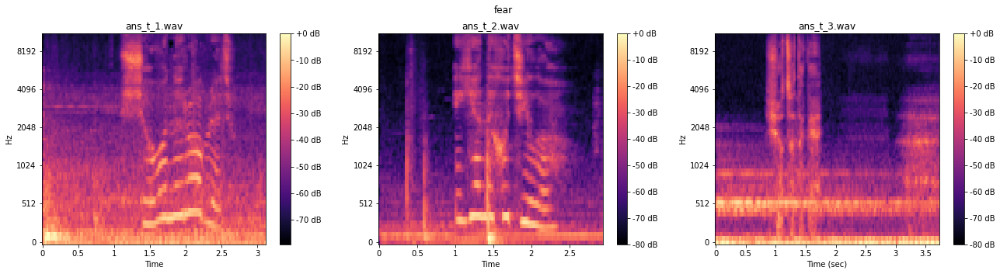

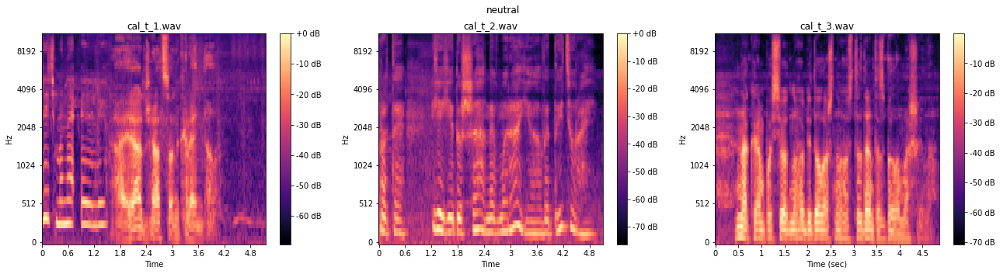

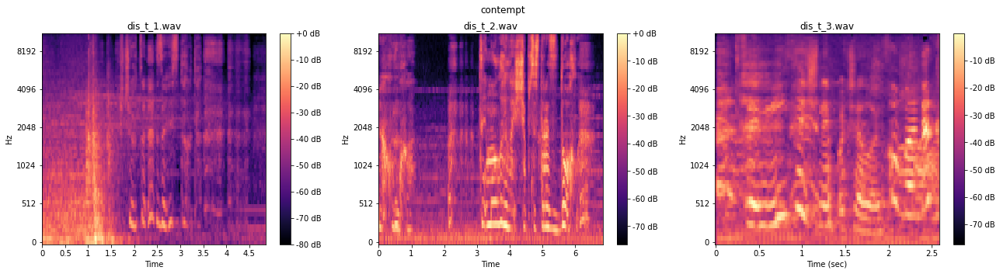

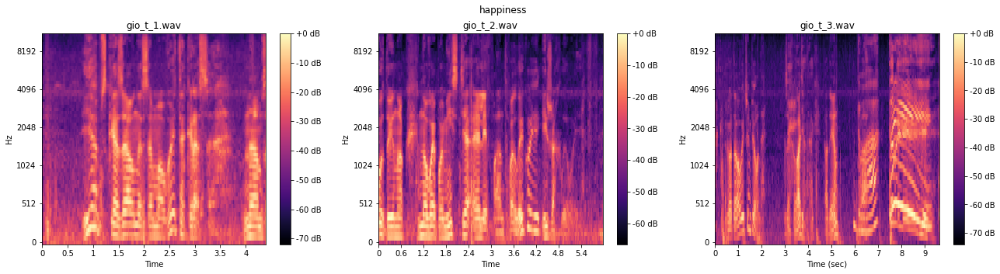

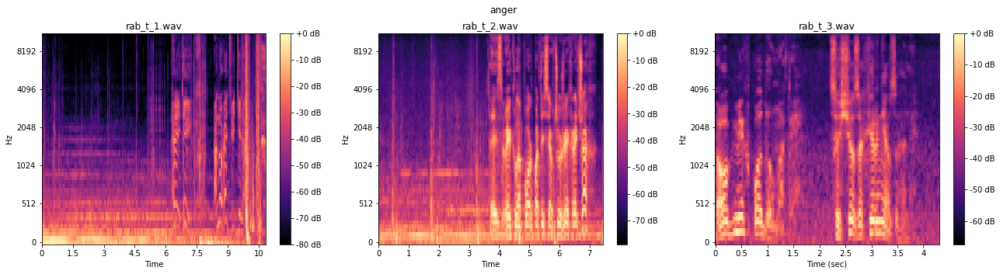

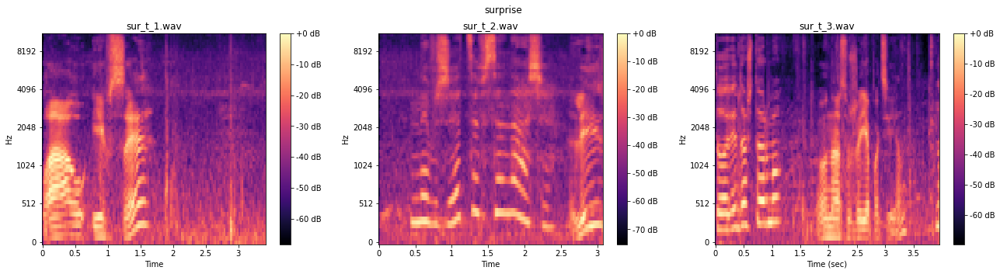

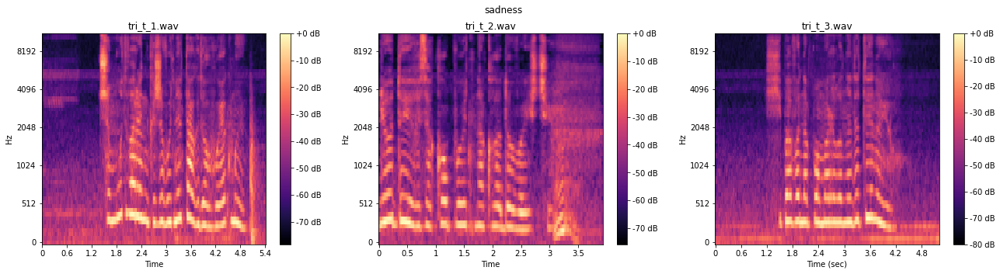

In [41]:
print_mel(emofilm_uk_examples, trim_silence=True)
 

## MFCC


In [42]:
def print_mfcc(df, trim_silence=False):
    emotions = df.emotion.unique()
    for e in emotions:
        rows = df.loc[df.emotion == e]
        fig, axs = plt.subplots(1, len(rows), figsize=(22, 5))
        ai = 0
        for i, row in rows.iterrows():
            a, s = librosa.load(row.path)
            if (trim_silence):
                a, index = librosa.effects.trim(a)

            mfccs = librosa.feature.mfcc(y=a, sr=sr, n_mfcc=64, n_fft=1024, hop_length=345)
            # mel_spect = librosa.power_to_db(mel, ref=np.max)

            axs[ai].set_title(basename(row.path))
            img = librosa.display.specshow(mfccs, x_axis='time', ax=axs[ai])
            fig.colorbar(img, ax=[axs[ai]])
            ai += 1


        # for ax in axs.flat:
        #     ax.set(ylabel='Mel')
        fig.suptitle(f'{e}')

        plt.xlabel('Time (sec)')
        plt.show()


### complete

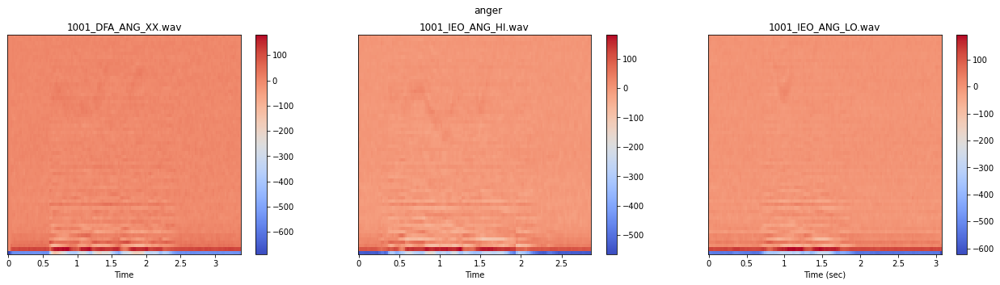

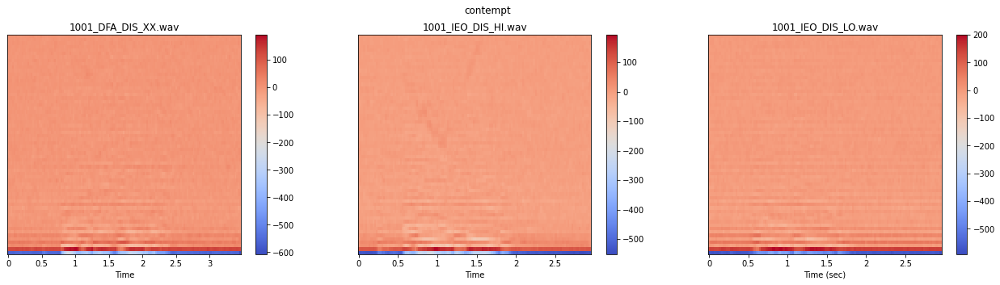

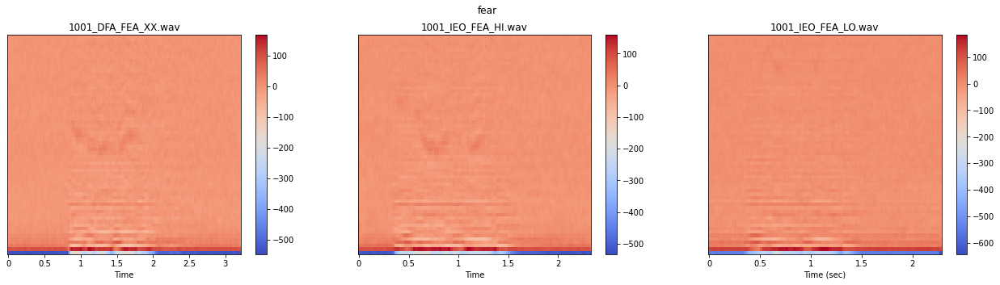

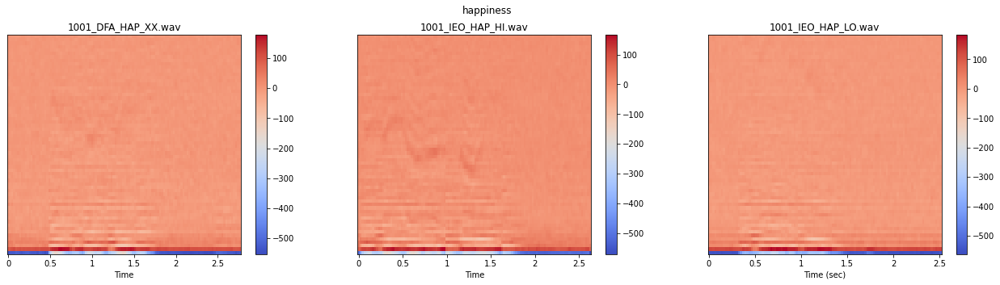

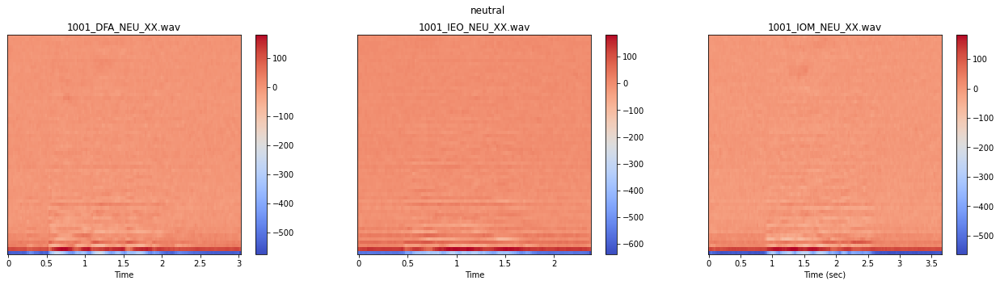

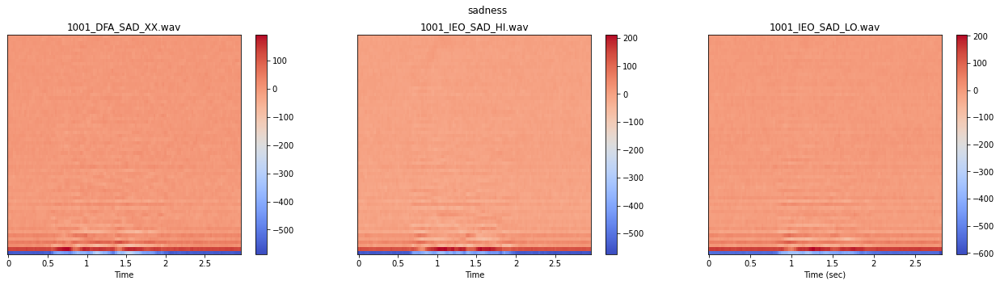

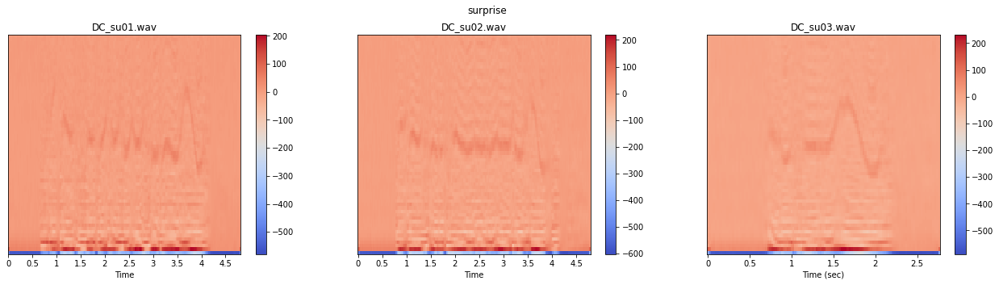

In [43]:
print_mfcc(complete_examples)

### male

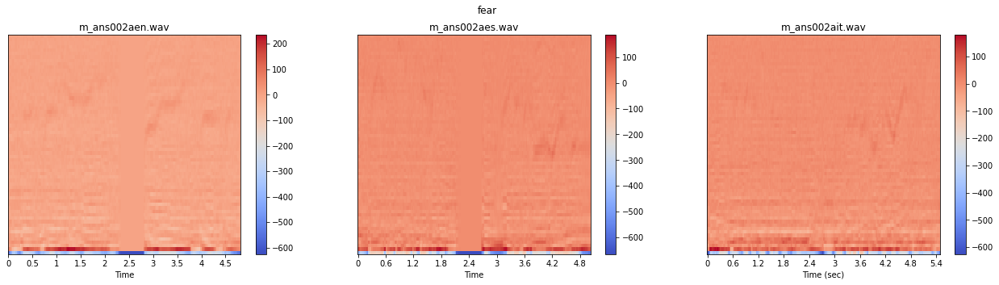

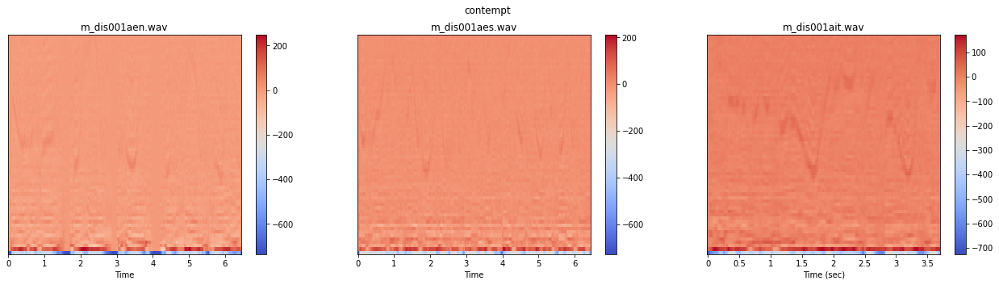

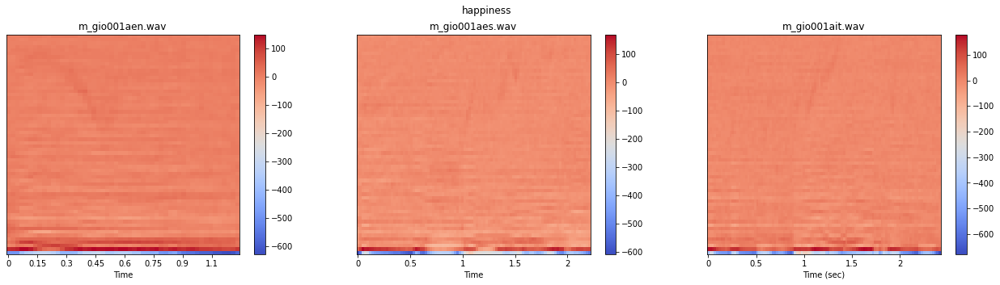

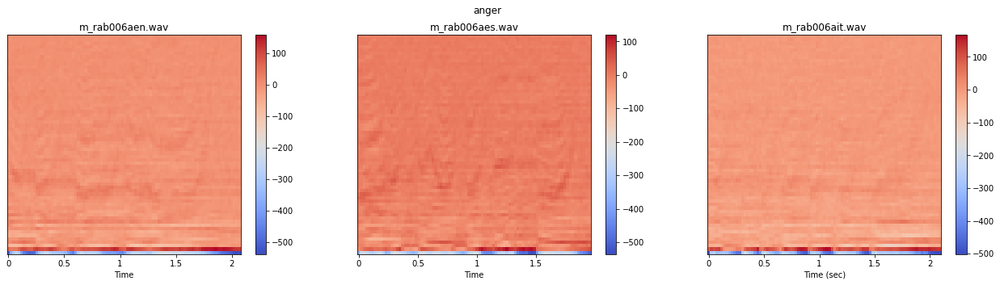

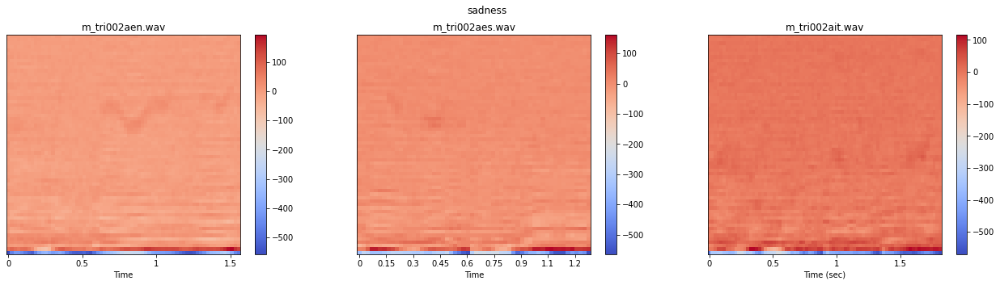

In [44]:
print_mfcc(emofilm_m_filtered)

### female

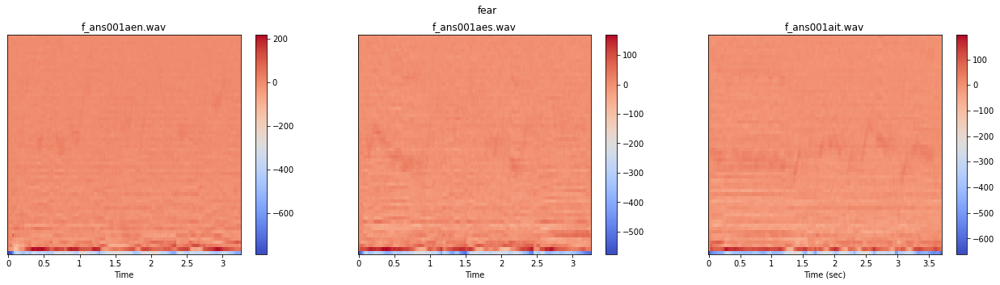

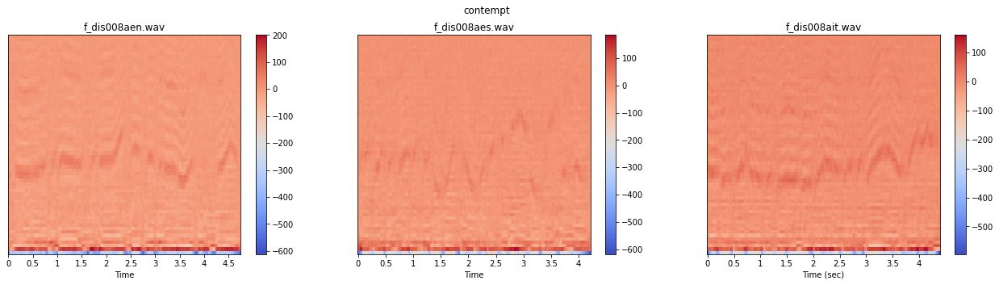

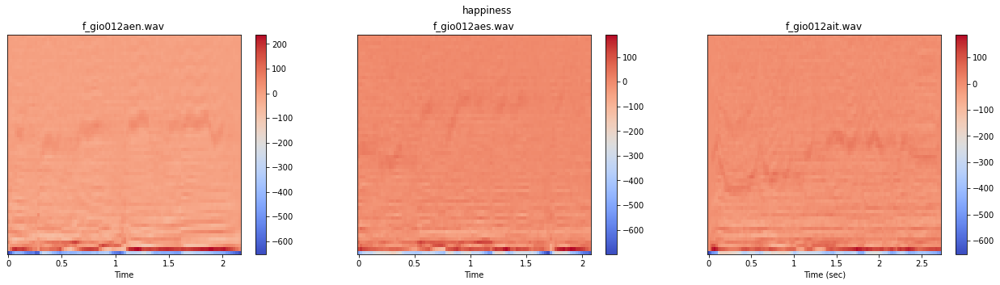

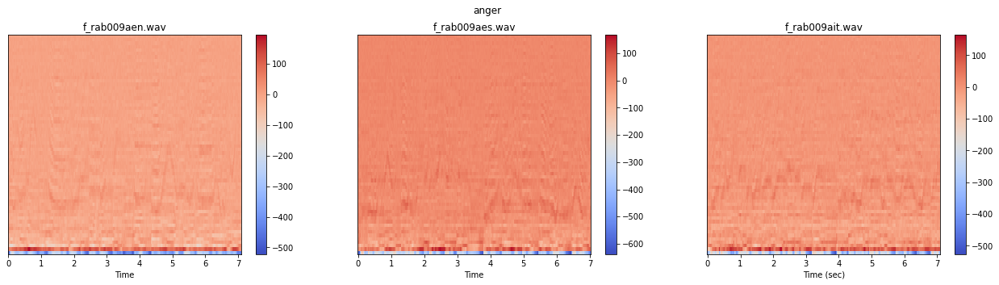

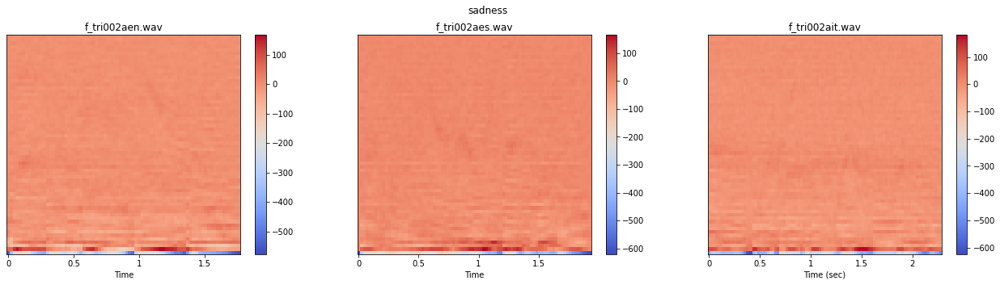

In [45]:
print_mfcc(emofilm_f_filtered)

### ukrainian

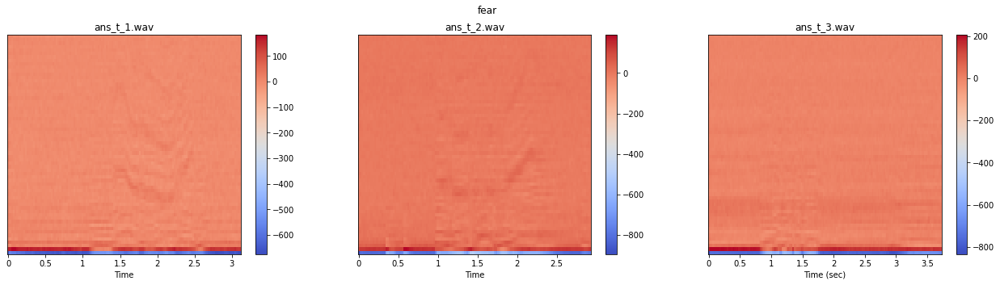

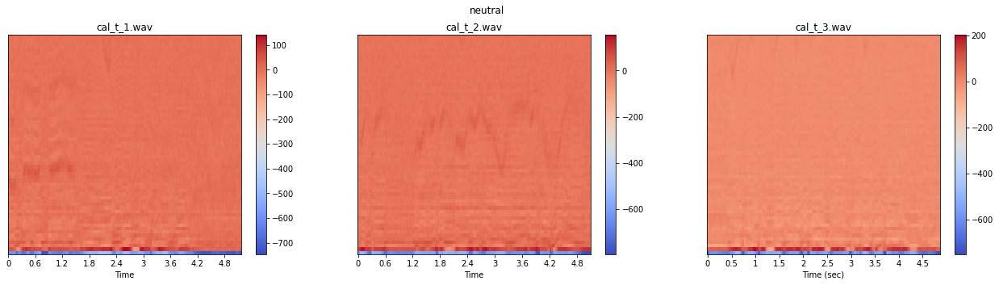

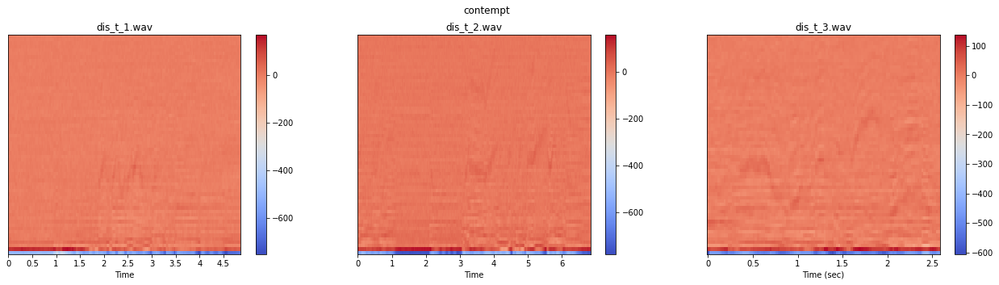

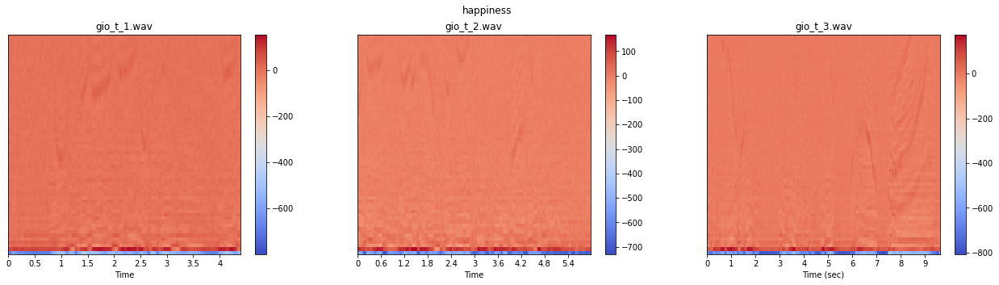

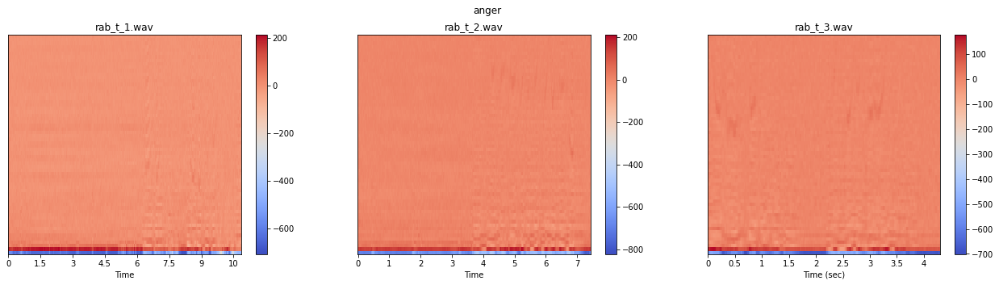

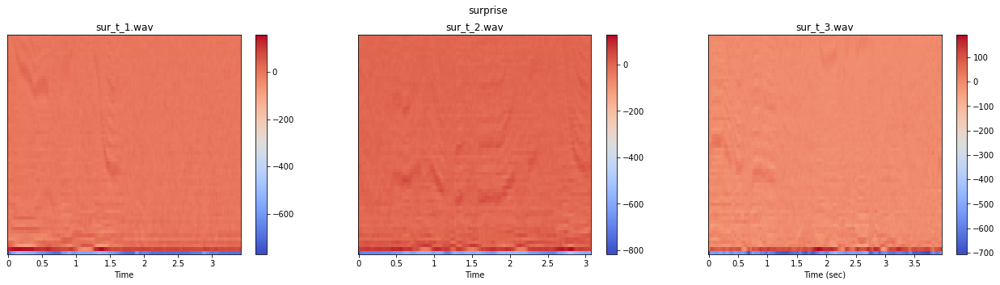

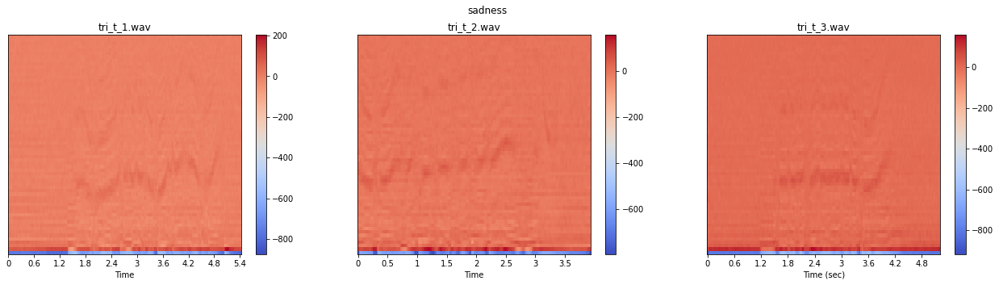

In [46]:
print_mfcc(emofilm_uk_examples, trim_silence=True)

## STFT

In [47]:
def print_stft(df, trim_silence=False):
    emotions = df.emotion.unique()
    for e in emotions:
        rows = df.loc[df.emotion == e]
        fig, axs = plt.subplots(1, len(rows), figsize=(22, 5))
        ai = 0
        for i, row in rows.iterrows():
            a, s = librosa.load(row.path, duration=2)
            a = librosa.util.fix_length(a, size=(2* 22050))
            if (trim_silence):
                a, index = librosa.effects.trim(a)

            stft = np.abs(librosa.stft(a, n_fft=126, hop_length=690, win_length=126))
            stft_db = librosa.amplitude_to_db(stft, ref=np.max)
            print(stft_db.shape)
            img = librosa.display.specshow(stft_db, x_axis='time', y_axis='log', ax=axs[ai])
            axs[ai].set_title(basename(row.path))
            fig.colorbar(img, ax=[axs[ai]], format="%+2.0f dB")
            ai += 1

            # mfccs = librosa.feature.mfcc(y=a, sr=sr, n_mfcc=64, n_fft=1024, hop_length=345)
            # axs[ai].set_title(basename(row.path))
            # img = librosa.display.specshow(mfccs, x_axis='time', ax=axs[ai])
            # fig.colorbar(img, ax=[axs[ai]])
            # ai += 1


        fig.suptitle(f'{e}')

        plt.xlabel('Time (sec)')
        plt.show()

### complete

(64, 64)
(64, 64)
(64, 64)


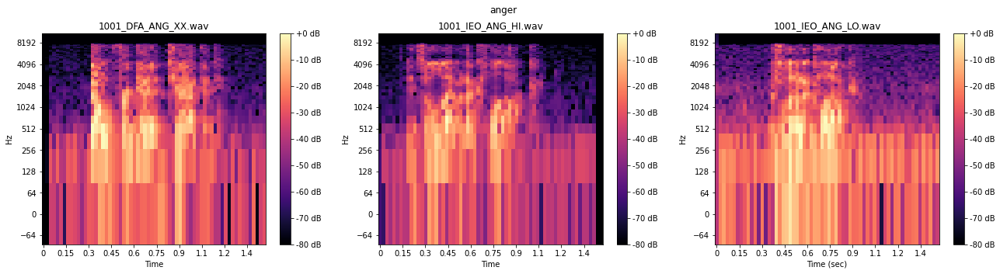

(64, 64)
(64, 64)
(64, 64)


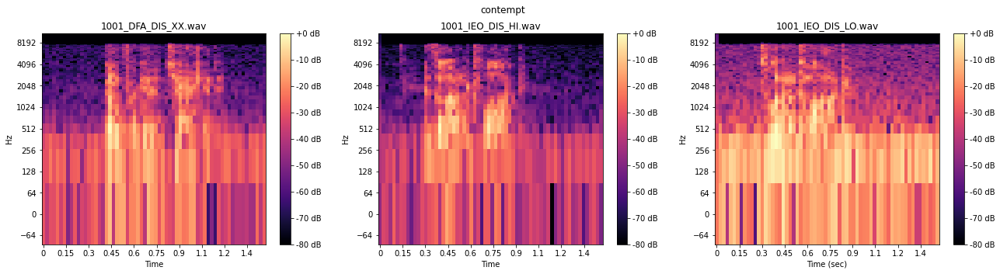

(64, 64)
(64, 64)
(64, 64)


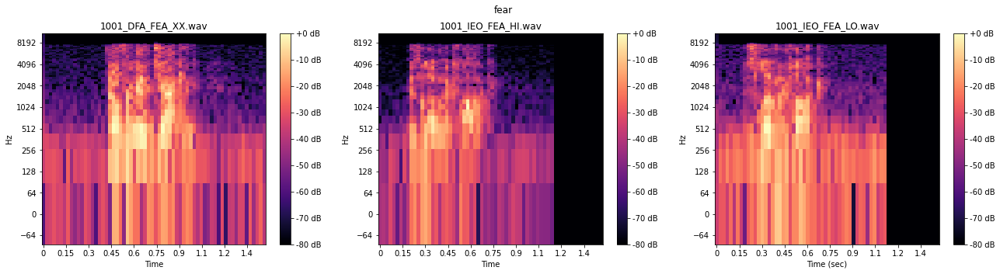

(64, 64)
(64, 64)
(64, 64)


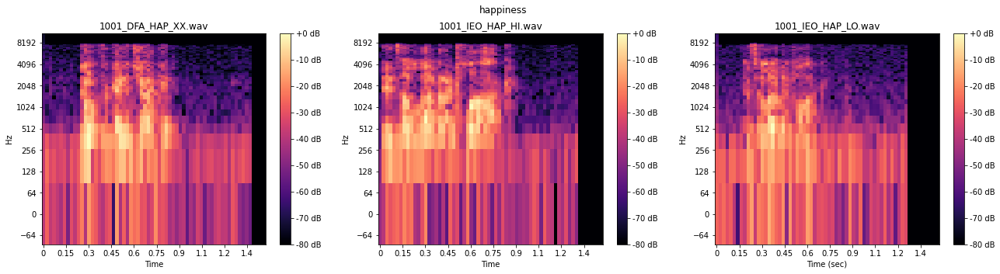

(64, 64)
(64, 64)
(64, 64)


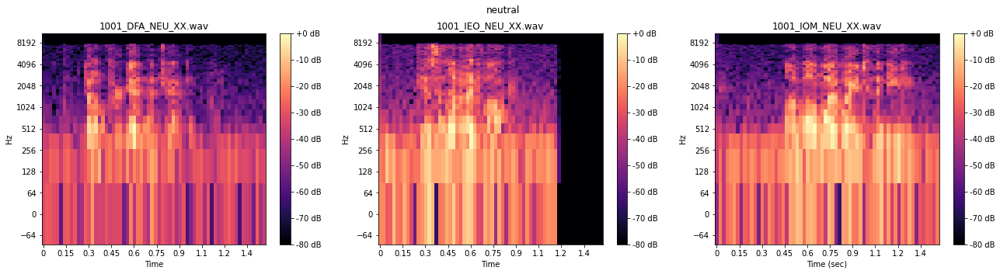

(64, 64)
(64, 64)
(64, 64)


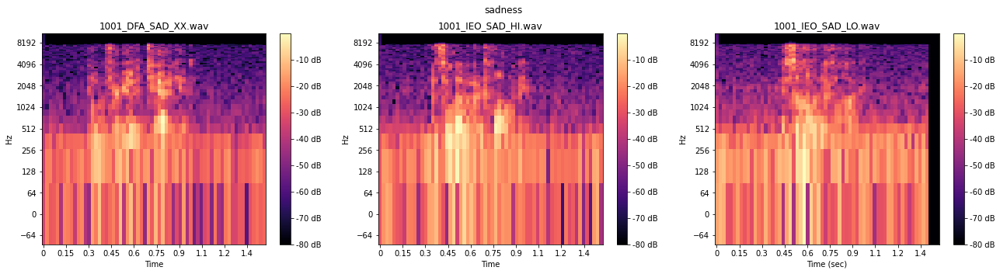

(64, 64)
(64, 64)
(64, 64)


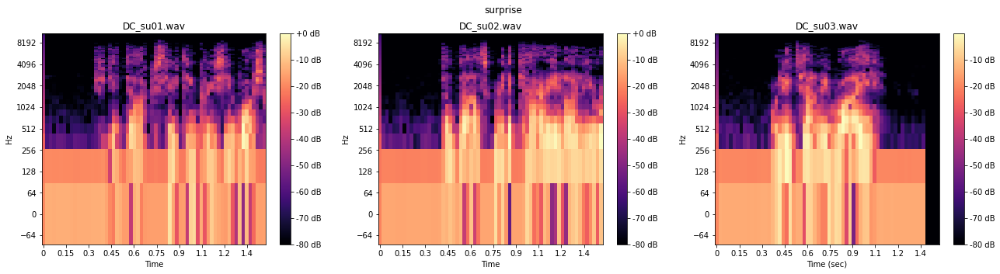

In [48]:
print_stft(complete_examples)


## Zero crossing